# Dog Breed Identification
This notebook builds an end to end multiclass image classifierusing Tensorflow Hub.
## Problem Defination
The goal is to create a classifier capable of determining a dog's breed from a photo. 
## Data :
The data is downloaded from kaggle. link as follows :
https://www.kaggle.com/c/dog-breed-identification/data
  
## Evaluation
For each image in the test set, we must predict a probability for each of the different breeds.
for more info : https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## Features 
Some Features about the data :
* we're dealing with images(unstructured data) so best we use deep learning, transfer learning.
* It contains 120 different breeds of dogs.
* Each image has a filename that is its unique 
* There are about 10000+ images in the training sets(these images contains labels) and 10000+ images in the test sets(these images do not have labels because we want to predict them.)

Unzipping the file that we have saved to google drive.

In [ ]:
#!unzip '/content/drive/My Drive/Dog_breed_prediction/dog-breed-identification.zip' -d 'drive/My Drive/Dog_breed_prediction/'

Getting our workspace ready.
* import tensorflow
* import tensorflow hub
* check whether we have a running GPU

In [1]:
import tensorflow as tf
import tensorflow_hub as hub
import os

In [3]:
print('Tensor Flow version :',tf.__version__)
print('Tensor Flow Hub version :',hub.__version__)
print('GPU available' if tf.config.list_physical_devices('GPU') else 'GPU not availabvle')

Tensor Flow version : 2.3.0
Tensor Flow Hub version : 0.9.0
GPU available


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


we can see that our tesnor flow version is 2.x which is great and we also have a gpu available if not available then do the following steps....

Goto Runtime -> Change runtime type -> GPU

In [ ]:
#let's check again
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

## Getting our data ready.
Now as our gpu is ready let's import our data

In [4]:
import numpy as np
import pandas  as pd
label_csv = pd.read_csv('drive/My Drive/Dog_breed_prediction/labels.csv')

In [5]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [6]:
label_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,50c50de3f2fa733d729309d09ba2398c,scottish_deerhound
freq,1,126


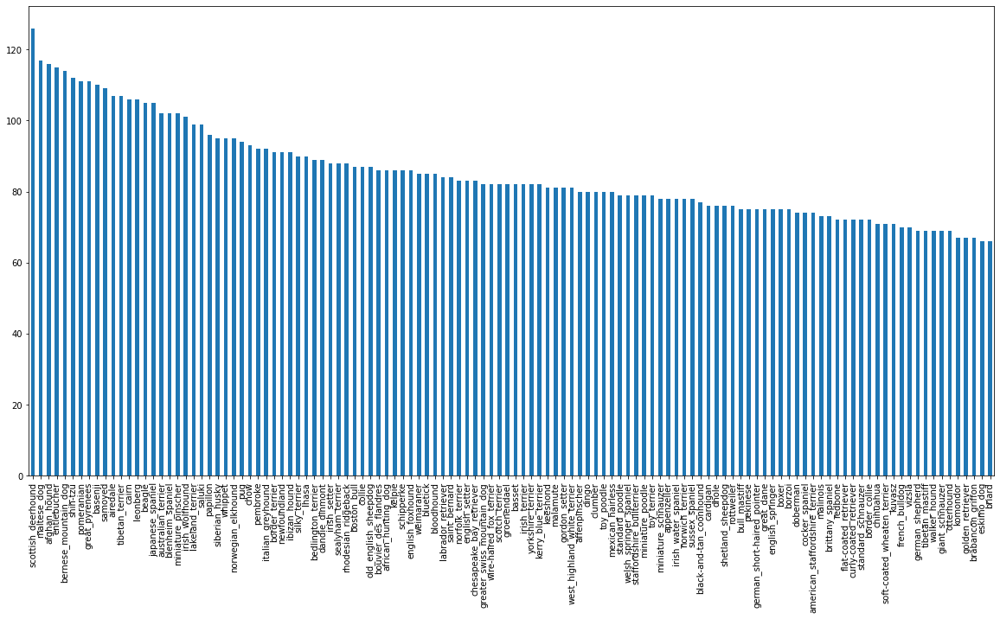

In [7]:
label_csv['breed'].value_counts().plot.bar(figsize = (20,10));

Now let's view an image from file

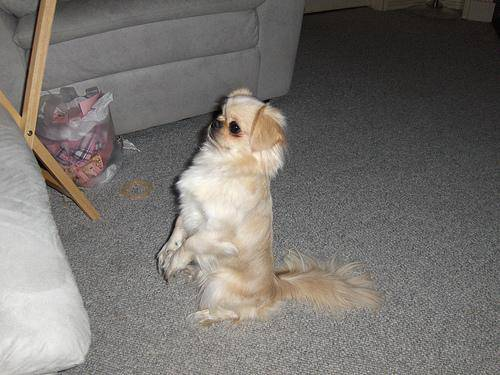

In [8]:
from IPython.display import Image
Image('drive/My Drive/Dog_breed_prediction/train/001cdf01b096e06d78e9e5112d419397.jpg')

Now we are going to create a 'filenames' list which contains the path of all the image names seperately. so that later on we can access them.

In [9]:
filenames = ['drive/My Drive/Dog_breed_prediction/train/' + fname + '.jpg' for fname in label_csv['id']]

In [10]:
filenames[9]

'drive/My Drive/Dog_breed_prediction/train/0042188c895a2f14ef64a918ed9c7b64.jpg'

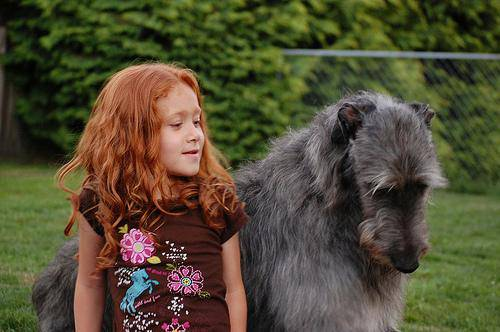

In [11]:
Image(filenames[9])

since we've now got our training image filepaths in list, let's prepare our labels (convert them into array) 

In [12]:
labels = label_csv['breed']
labels = np.array(labels)
labels 

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

Let's check whether the number of labels matches the number of filenames(checking for missing data)

In [13]:
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames...')
else :
  print('Number of labels do not match...')

Number of labels matches number of filenames...


so now we can see that our data doesn't contain any missing values.
now let's convert our labels into unique labels

In [14]:
unique_labels = np.unique(labels)
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [15]:
# Turn a single label into array of boolean labels
print(labels[0])
labels[0] == unique_labels 

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
#let's do the same for all the labels using list comprehension
bool_labels = [label == unique_labels for label in labels]

In [17]:
bool_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
print(labels[0])   # Original label
print(np.where(labels[0] == unique_labels))       # index where Labels occurs
print(bool_labels[0].argmax())           #Index where labels occur in boolean labels
print(bool_labels[0].astype(int))      #There will be one where sample labels occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set(optional)
As the data that we got from kaggle dosen't contain a validation set we will split the data into validation set.

In [19]:
x = filenames
y = bool_labels

In [20]:
# we are going to start off with experimenting with 1000 images and increase as needed.
NUM = 1000 #@param {type : 'slider',min : 1000,max : 10000}

In [21]:
from sklearn.model_selection import train_test_split
np.random.seed(42)
x_train,x_val,y_train,y_val = train_test_split(x[:NUM],
                                               y[:NUM],
                                               test_size = 0.2)
len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

## Preprocessing the images(Turning images to tensors)
To turn our images into tensors we are going to write a function that does a few things:

1) Take an image filepath as input.

2) Use tensorflow to read the file and store it to a variable 'image'.

3) Turn our 'image' into tensor.

4) Resize the image to be a shape of (244,244)

5) Normalize our images (Convert color channel values from 0-255 to 0-1)

6) Return the modified image.


In [22]:
#Define an image size
IMG_SIZE = 224

#Define a function for image preprocessing
def image_preprocess(image_path,img_size = IMG_SIZE):
  #Read the image file
  image = tf.io.read_file(image_path)
  #Turn the jpeg image into numerical tensor with 3 color channels(Red,Green,Blue)
  image = tf.image.decode_jpeg(image,channels = 3)
  #Convert the color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to our desired value
  image = tf.image.resize(image,size =[IMG_SIZE,IMG_SIZE])
  return image

## Turning data into batches
Why turn our data into batches?
let's say you are trying to process 10000+ images at a time so there may be a case that your data may not fit into memory.

So that's why we do 32(that's the batch size) images at a time(You can manually adjust the batch size)

In order to use TensorFlow we need to convert our data into tensor tuples as '(image,labels)'

In [23]:
#Create sample function to create a tensor tuple in the form of '(image,labels)'
def get_image(image,labels):
  image = image_preprocess(image)
  return image,labels

In [24]:
get_image(x[0],tf.constant(y[0]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5705322 , 0.33588538, 0.15008473],
         [0.66901225, 0.4601166 , 0.26022965],
         [0.61062384, 0.43763596, 0.21601713],
         ...,
         [0.8182312 , 0.7297958 , 0.26963907],
         [0.72454786, 0.6059109 , 0.2653059 ],
         [0.7494603 , 0.6252918 , 0.32456532]],
 
        [[0.6761415 , 0.4733761 , 0.30642927],
         [0.5672121 , 0.38192675, 0.20349538],
         [0.5883547 , 0.4322571 , 0.2403155 ],
         ...,
         [0.9326942 , 0.8260503 , 0.41093278],
         [0.86072475, 0.74250627, 0.3694122 ],
         [0.76781666, 0.6461604 , 0.29291284]],
 
        [[0.46350825, 0.29595745, 0.1536156 ],
         [0.42554107, 0.27039403, 0.12009468],
         [0.7887875 , 0.6547362 , 0.49015   ],
         ...,
         [0.89372385, 0.7696401 , 0.41811958],
         [0.88609535, 0.7585918 , 0.36495727],
         [0.8243601 , 0.69494826, 0.2930575 ]],
 
        ...,
 
        [[0.7344025 , 0.4716574 

Now we have got a functtion that can turn our data into tensor tuple in the form of '(image,tuple)', let's divide our data into batches using a function.

In [25]:
# Define a batch size 
BATCH_SIZE = 32

# Let's Define a function to turn our data into batches
def create_data_batches(x,y = None,batch_size = BATCH_SIZE,test_data = False,val_data = False):
  #If the data set is test set then we don't have labels
  if test_data :
    print('Creating test data Batches')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch = data.map(image_preprocess).batch(BATCH_SIZE)
    return data_batch
  #If the data set is validation set then we don't need to reshuffle it
  elif val_data:
    print('Creating validation data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    data_batch = data.map(get_image).batch(BATCH_SIZE)
    return data_batch
  # if the data is train data we need to shuffle it
  else :
    print('Creating Training data batches')
    #Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    #Shuffle the data
    data = data.shuffle(buffer_size = len(x))
    #Create '(image,label)' tensor tupple
    data = data.map(get_image)
    # Turn into Batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [26]:
#Check out different attributes of our data batches
training_data = create_data_batches(x_train,y_train)
valid_data = create_data_batches(x_val,y_val,val_data = True) 

Creating Training data batches
Creating validation data batches


In [27]:
training_data.element_spec,valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now converted into batches but however it becomes quite a difficult task to understand the data so let's visualize the data batch.


In [28]:
import matplotlib.pyplot as plt

In [29]:
#Create a function for viewing images of data batches
def show_images(images,labels):
  '''Displays a plot of 25 images and their labels'''
  plt.figure(figsize = (10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_labels[labels[i].argmax()])
    plt.axis('off')

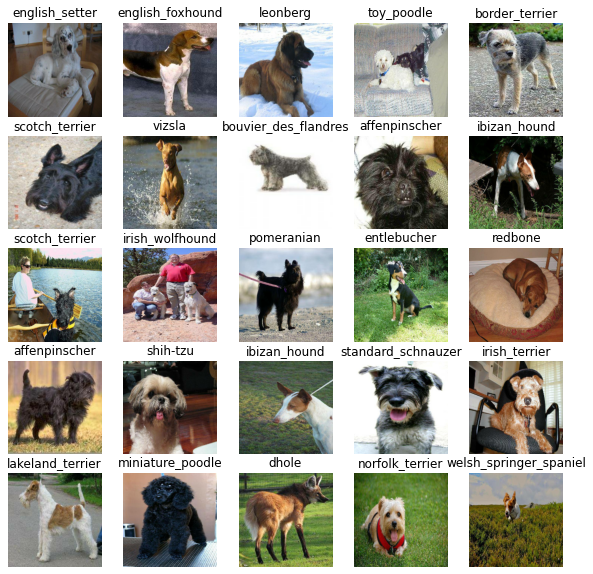

In [30]:
# As our data is in batches we need to unbatch it for visualizing
train_image,train_label = next(training_data.as_numpy_iterator())
show_images(train_image,train_label)

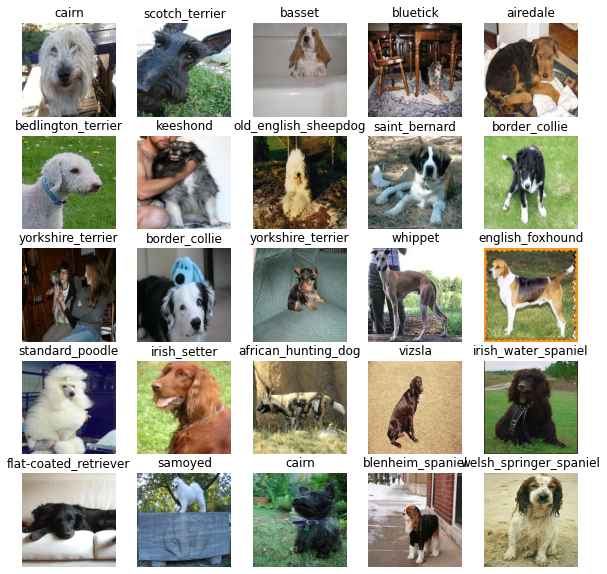

In [31]:
# Let's Visualize for validation data
valid_image, valid_label = next(valid_data.as_numpy_iterator())
show_images(valid_image,valid_label)

## Building a model
Before we build a model, there are few things we need to define:

* The input shape(our image shape, in the form of tensors) to our model
* The output shape(image labels, in the form of tensors)of our model.
*The url of the model we want to use from tensor flow.  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [32]:
#Setup input shape to the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]

#setup output shape of our model
OUT_SHAPE = len(unique_labels)

#setup model URL from tensor flow hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4' 

Now we have got our inputs, outputs and the model ready to go...let's put them together into keras deep learning model.

Let's create  a function which :

* Takes the input shape,output shape and the model we have choosen as parameters.
* Defines the layers of keras model in sequential manner(do this first,then this then that)
* Compiles the model(says it should be evaluated and improved)
* Builds the model(tells the model the input shape it will be getting)
* Return the model.

All these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [33]:
#Create a function which builds a keras model(Instantiate a model)
def create_model(input_size = INPUT_SHAPE,out_size = OUT_SHAPE,model_url = MODEL_URL):
  print('Building model with :',model_url)
  #Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL),
                               tf.keras.layers.Dense(units = OUT_SHAPE,activation = 'softmax')
  ])
  #Compile the model
  model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),
                optimizer = tf.keras.optimizers.Adam(),
                metrics = ['accuracy'])
  #Build the model
  model.build(INPUT_SHAPE)
  return model

In [34]:
model = create_model()
model.summary()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks
callbacks are helper function which a model can use to do things such as check it's progress or stop training if a model stops improving.

we will create two callbacks one for tensorboard which helps track our model's progress and another for early stopping which prevents our model from training for too long.

### Tensor board callback
To setup tensorboard callback we need to do three things:

* Load the tensorboard notebook extension.
* Create a tensorboard callback which is able to save logs to a directory and pass it to our model's fit() function
* Visualize our training logs with the %tensorboard magic function(we will do this after model training)

In [35]:
#Load tensorboard notebook extension
%load_ext tensorboard
import datetime

In [36]:
#Create a function to build tensorboard callback
def create_tensorboard_callback():
  logdir = os.path.join('drive/My Drive/Dog_breed_prediction/log',
            datetime.datetime.now().strftime('%d%m%Y--%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callbacks
Early stopping helps our model from overfitting by stopping training if a certain evaluation metrics stops improving.

In [37]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience = 3)

## Training a model(on subset of data)
Our first model is only going to train on 1000 images, to make sure everythingt is working.
 

In [38]:
NUM_EPOCHES = 100 #@param {type : 'slider',min : 10,max : 100,step : 10}

Let's create a function which trains our model.
* Create a model using create_model()
* setup a tensorboard callback using create_tensor_borad_callback() function
* call the fit() function on our training data(passing it training_data and valid_data, numvber of epoches to train for and the callbacks )
* Return the model
 

In [39]:
def train_model():
  #Create a model
  model = create_model()
  #Create a new tensor board session everytime we train a model
  tensorboard = create_tensorboard_callback()
  #Fit the model to the data passing it callbacks we created
  model.fit(x = training_data,
            epochs = NUM_EPOCHES,
            validation_data = valid_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  return model 

In [ ]:
model = train_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 5.4511 - accuracy: 0.0625WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 446s 18s/step - loss: 4.4006 - accuracy: 0.1138 - val_loss: 3.4829 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 4s 167ms/step - loss: 1.5882 - accuracy: 0.6637 - val_loss: 2.2238 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 4s 167ms/step - loss: 0.5481 - accuracy: 0.9500 - val_loss: 1.7477 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 4s 167ms/step - loss: 0.2473 - accuracy: 0.9887 - val_loss: 1.5783 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1420 - accuracy: 0.9987 - val_loss: 1.4956 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 4s 171ms/step - loss: 0.0989 - accuracy: 1.0000 - val_loss: 1.4450 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 4s 167ms/step - loss: 0.0745 - accuracy: 1.0000 - val_loss: 1.4201 - val_accuracy: 0.6500
Epoch 8/100

It looks like our model is overfitting because it's performance on training data is far better than on validation data.

Overfitting to begin with is actually a good thing....

### Checking tensorboard Logs
The tensorboard magic function(%tensorboard) will access the log directory we created earlier and visualize its content.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog_breed_prediction/log

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

Make predictions on validation data(not used to train on)

In [ ]:
predict = model.predict(valid_data,verbose = 1)

7/7 [==============================] - 1s 106ms/step


In [ ]:
index = 3
print(predict[index])
print('Max Value(Probability of prediction :{}'.format(np.max(predict[index])))
print('Sum :{}'.format(np.sum(predict[index])))
print('Max index :{}'.format(np.argmax(predict[index])))
print('Prediction Label :{}'.format(unique_labels[np.argmax(predict[index])]))

[3.7562416e-03 8.3468659e-03 2.5710044e-04 3.9015252e-03 5.2663736e-04
 6.7087165e-03 6.9038249e-03 5.1135186e-04 2.0087784e-02 1.6474228e-02
 4.0607360e-05 1.7899062e-02 2.9670852e-04 5.8172841e-02 4.6631903e-04
 2.8320378e-01 3.0617186e-05 3.6326949e-02 7.3446397e-05 9.1441298e-06
 2.6823934e-02 3.2644911e-04 2.1549505e-04 5.3589651e-05 1.2970773e-02
 2.1442106e-04 1.4362973e-04 1.1680874e-03 1.5045744e-03 8.6974629e-05
 4.9501294e-05 1.6036455e-03 5.9366315e-03 9.1588893e-04 2.4555344e-04
 2.7621442e-03 1.6839502e-04 3.5681215e-03 1.8403435e-04 2.9472075e-03
 1.1055459e-02 6.8911999e-05 4.3837922e-03 2.1180901e-04 5.2299444e-04
 7.0633780e-07 7.0148607e-04 1.3850687e-02 3.3094564e-03 1.2860976e-03
 1.2303224e-03 2.6796371e-05 1.1934625e-03 6.0668357e-05 3.2328848e-05
 5.0910171e-03 3.7320328e-03 1.6597770e-02 9.7442273e-05 1.1566358e-02
 1.8951865e-05 8.8596083e-03 5.2332104e-04 1.3496922e-04 2.9532548e-06
 4.4508404e-03 1.3592950e-03 2.6980282e-03 1.3118531e-01 6.0968337e-05
 4.645

In [40]:
def get_pred_label(prediction):
  return unique_labels[np.argmax(prediction)]

In [ ]:
#check it
a = get_pred_label(predict[9])

In [ ]:
a

'collie'

Now our validation data is still in batch datset we need to unbatch it for visualizing the data so let's create a function to unbatch the data.

In [41]:
def unbatch(data):
  '''
  Takes a batch dataset of '(image,label)' tensors and returns seperate array of images and true labels
  '''
  image = []
  label = []
  for i,l in data.unbatch().as_numpy_iterator():
    image.append(i)
    label.append(unique_labels[np.argmax(l)])
  return image,label

In [42]:
val_image,val_label = unbatch(valid_data)

In [43]:
val_image[9],val_label[9]

(array([[[0.57496583, 0.7391202 , 0.45904583],
         [0.5625462 , 0.7370727 , 0.43684438],
         [0.52503353, 0.7138991 , 0.38354194],
         ...,
         [0.6497376 , 0.8278213 , 0.48313227],
         [0.55540496, 0.7232763 , 0.36115664],
         [0.55714893, 0.72079563, 0.35121408]],
 
        [[0.49918428, 0.67555785, 0.37932736],
         [0.52318823, 0.7070197 , 0.39676383],
         [0.49320585, 0.68733615, 0.3543466 ],
         ...,
         [0.5765649 , 0.7520614 , 0.39863497],
         [0.540867  , 0.72110474, 0.3541133 ],
         [0.5544867 , 0.7356229 , 0.36593625]],
 
        [[0.47358978, 0.6652827 , 0.3454189 ],
         [0.5080031 , 0.7015168 , 0.37786728],
         [0.45995972, 0.6585854 , 0.31655982],
         ...,
         [0.5032087 , 0.67858326, 0.30991903],
         [0.4940652 , 0.6918457 , 0.32086602],
         [0.5175947 , 0.7196189 , 0.35275078]],
 
        ...,
 
        [[0.5777447 , 0.6531035 , 0.43029678],
         [0.5473978 , 0.6266781 , 0.42137

Now we have got ways to get :
* Prediction labels
* Validation labels
* Validation images 

We will create a function which :
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the prediction label, its predicted probability, the truth label and the target image on the single plot.

In [44]:
def plot_images(prediction_probabilities,labels,images,n=1):
  '''
  View Prediction, ground truth and image for n
  '''
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)
  
  # sshow image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Set the color
  if pred_label == true_label:
    colors = 'Green'
  else:
    colors = 'Red'
    
  plt.title('{} {:.2f}% {}'.format(pred_label,np.max(pred_prob)*100,true_label),
            color = colors)

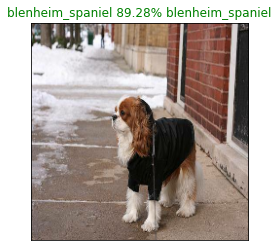

In [ ]:
plot_images(prediction_probabilities=predict,labels = val_label,images = val_image,n = 23)

Now we have got a function to view top predictions and model let's build another function to view top 10  predictions.
This function will :
* Take an input of array of prediction probabilities and a ground truth array and an integer.
* Find the prediction using get_pred_label()
* Find the top 10 :
  * Prediction probabilities index.
  * Prediction probabilities values.
  * Prediction labels.
* Plot the top 10 prediction probability values and labels,coloring the true label green.  

In [ ]:
def plot_pred_conf(prediction_proba,labels,n = 1):
  '''
  Plot the top 10 highest prediction confidences alon with the true labels for n samples
  '''
  pred_prob,true_label = prediction_proba[n],labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # find the top 10 prediction confidence indexes
  top_10_indexes = pred_prob.argsort()[-10:][::-1]

  # find the top 10 prediction confidence values
  top_10_values = pred_prob[top_10_indexes]
  
  #find the top 10 prediction labels
  top_10_pred_labels = unique_labels[top_10_indexes]
  
  #setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_values,color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')
  
  #Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else :
    pass
  

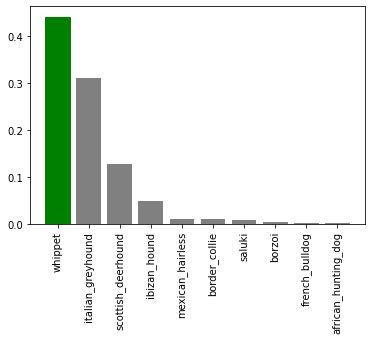

In [ ]:
plot_pred_conf(prediction_proba=predict,labels = val_label, n=13)

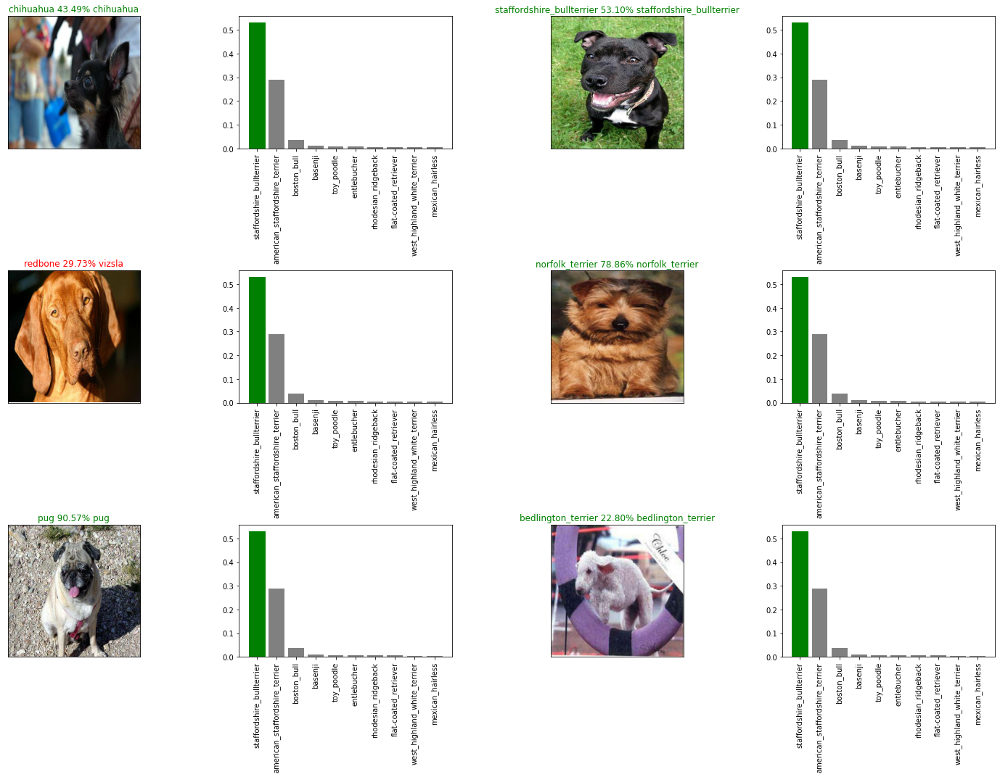

In [ ]:
# Let's check out a few predictions and their values
a = 49
num_rows,num_cols = 3,2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_images(prediction_probabilities=predict,
              labels = val_label,
              images = val_image,
              n = a+i)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_proba=predict,
                 labels = val_label,
                 n = a + 1)
plt.tight_layout(h_pad = 1.0)
plt.show()


## Saving and Reloading a trained model


In [53]:
def save_model(model_path,suffix = None):
  '''
  saves a model in model directory and appends a suffix (string)
  '''
  modeldir = os.path.join('drive/My Drive/Dog_breed_prediction/model',
                          datetime.datetime.now().strftime('%d%m%Y - %H%M%s'))
  model_path = modeldir+'-'+suffix+'.h5'
  print('saving model to :{}'.format(model_path))
  model.save(model_path)
  return model_path

In [54]:
#Create a function to load the model
def load_model(model_path):
  '''Loads a saved model from aspecified path
  '''
  print('loading model from :{}'.format(model_path))
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [ ]:
save_model(model,suffix='1000_images_mobilenetv2_adam')

saving model to :drive/My Drive/Dog_breed_prediction/model/05102020 - 09471601891230-1000_images_mobilenetv2_adam.h5


'drive/My Drive/Dog_breed_prediction/model/05102020 - 09471601891230-1000_images_mobilenetv2_adam.h5'

##  Training a Dog_breed_prediction model

In [45]:
# First create a data batch
full_data = create_data_batches(x,y)
full_data

Creating Training data batches


<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [46]:
#Create a model for full model
full_model = create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [47]:
#Create full model callback
full_tensorboard = create_tensorboard_callback()

# create Early stoping callback as we don't have validation set so we can't monitor validation accuracy
full_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',
                                                   patience = 3) 

In [ ]:
# Fit the model to the full data
full_model.fit(full_data,
               epochs = NUM_EPOCHES,
               callbacks = [full_tensorboard,full_early_stopping])

Epoch 1/100
320/320 [==============================] - 4458s 14s/step - loss: 1.3351 - accuracy: 0.6665
Epoch 2/100
320/320 [==============================] - 39s 123ms/step - loss: 0.3977 - accuracy: 0.8846
Epoch 3/100
320/320 [==============================] - 40s 124ms/step - loss: 0.2359 - accuracy: 0.9367
Epoch 4/100
320/320 [==============================] - 39s 123ms/step - loss: 0.1548 - accuracy: 0.9624
Epoch 5/100
320/320 [==============================] - 39s 123ms/step - loss: 0.1051 - accuracy: 0.9789
Epoch 6/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0751 - accuracy: 0.9887
Epoch 7/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0573 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0453 - accuracy: 0.9956
Epoch 9/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0363 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 39s 123m

In [ ]:
# let's save our model
save_model(full_model,suffix='full-model-mobilenetv2-adam')

saving model to :drive/My Drive/Dog_breed_prediction/model/05102020 - 11521601898727-full-model-mobilenetv2-adam.h5


'drive/My Drive/Dog_breed_prediction/model/05102020 - 11521601898727-full-model-mobilenetv2-adam.h5'

## Making Predictions on test dataset
Since our model has been trained in the form of tensor batches, to make predictions on the test data, we will have to get it into the same format.

To make predictions on test data we will:
* get the test image filename
* conveert the filename into test data batches using create_data_batches(), and setting the test_data parameter to true
* Make prediction array by passing the test batches to the predict() method called on our model

In [48]:
#load test image filename
test_path = 'drive/My Drive/Dog_breed_prediction/test/'
test_filename = [test_path+fname for fname in os.listdir(test_path)]

In [49]:
test_filename[:10]

['drive/My Drive/Dog_breed_prediction/test/e383a31009f0779536d43816c10bf662.jpg',
 'drive/My Drive/Dog_breed_prediction/test/e2888231cedd08540816e629c0733922.jpg',
 'drive/My Drive/Dog_breed_prediction/test/df4a5ab3464b937e11467c395ed190b9.jpg',
 'drive/My Drive/Dog_breed_prediction/test/e00e5f7f822fd670bba314f87cce8428.jpg',
 'drive/My Drive/Dog_breed_prediction/test/e2d65ef41ec9a649c8dbd92f0b821163.jpg',
 'drive/My Drive/Dog_breed_prediction/test/dcccc266ef919edbf3416078edc849db.jpg',
 'drive/My Drive/Dog_breed_prediction/test/e200fe397f6ca5d626210830fc38aca9.jpg',
 'drive/My Drive/Dog_breed_prediction/test/de172eece3080506aa3bcf1967f4a90b.jpg',
 'drive/My Drive/Dog_breed_prediction/test/e09f4ff3f7acee994812650a2fc7edef.jpg',
 'drive/My Drive/Dog_breed_prediction/test/e55534e27f92b4c8177ed2beb1cbba7b.jpg']

In [50]:
len(test_filename)

10357

In [51]:
# create test data batches
test_full_data = create_data_batches(test_filename,test_data=True)

Creating test data Batches


In [55]:
# let's import the save model
load_path ='drive/My Drive/Dog_breed_prediction/model/05102020 - 11521601898727-full-model-mobilenetv2-adam.h5'
load_full_model = load_model(load_path)

loading model from :drive/My Drive/Dog_breed_prediction/model/05102020 - 11521601898727-full-model-mobilenetv2-adam.h5


In [56]:
# Make Predictions on test data batch using the loaded full model(this may take upto an hour to run)
test_predict = load_full_model.predict(test_full_data,verbose = 1)

324/324 [==============================] - 6728s 21s/step


In [ ]:
#Save Predictions(Numpy array) to csv file
np.savetxt('drive/My Drive/Dog_breed_prediction/preds_array.csv',
           test_predict,
           delimiter= ',')

In [57]:
# Load predictions
test_predictions = np.loadtxt('drive/My Drive/Dog_breed_prediction/preds_array.csv',
                              delimiter = ',')

In [58]:
test_predictions.shape

(10357, 120)

## Making Predictions on custom images
To make predictions on custom images we will:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). and since our custom images won't have labels we set the test_data parameter to true.
* Pass the custom data batch to our model's predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare thge predicted labels to the custom images.

In [59]:
custom_path = 'drive/My Drive/Dog_breed_prediction/dog_images/'
custom_image_path = [custom_path+fname for fname in os.listdir(custom_path)]


In [60]:
custom_image_data = create_data_batches(custom_image_path,test_data=True)

Creating test data Batches


In [61]:
custom_image_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [63]:
# Make predictions on the data
custom_pred = load_full_model.predict(custom_image_data)

In [64]:
custom_pred

array([[2.81648594e-04, 2.98203668e-06, 4.81524257e-05, 1.58595685e-05,
        1.09238699e-02, 7.71245141e-06, 2.67863099e-04, 2.37007323e-03,
        4.59046396e-06, 5.54450708e-06, 2.20923848e-05, 9.43007581e-06,
        5.21447451e-04, 1.07319083e-05, 9.09505397e-05, 2.10985600e-05,
        7.77505047e-05, 3.33810865e-04, 7.63584831e-06, 5.83282905e-04,
        6.47540728e-04, 1.07149233e-03, 1.14672002e-04, 1.98370282e-04,
        9.70301480e-05, 5.39368019e-04, 2.42668848e-05, 4.77718677e-05,
        1.77239627e-03, 5.00869821e-04, 8.39183922e-05, 4.95067332e-04,
        5.03833908e-05, 5.07172314e-04, 2.52764043e-03, 1.53900663e-04,
        1.19404040e-05, 2.26157397e-04, 4.19915043e-04, 1.76508802e-05,
        3.14439603e-05, 1.97194131e-05, 1.12325644e-04, 3.59611950e-05,
        2.79903831e-03, 7.06045015e-04, 5.09404563e-05, 1.89158670e-03,
        1.14981704e-04, 6.94229893e-05, 1.44578426e-05, 1.22517900e-04,
        1.67731734e-04, 7.59566274e-06, 3.79842561e-04, 1.932489

In [65]:
# Now get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_pred[i]) for i in range(len(custom_pred))]

In [66]:
custom_pred_labels

['staffordshire_bullterrier',
 'yorkshire_terrier',
 'soft-coated_wheaten_terrier',
 'dingo']

In [67]:
# Get custom images
custom_images = []
for image in custom_image_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

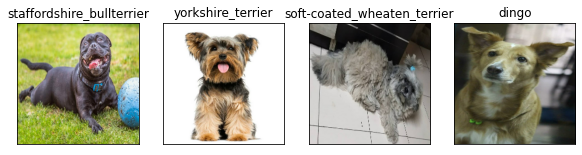

In [68]:
plt.figure(figsize = (10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)